In [29]:
#Not all these packages are required but they are here for completeness
import importlib
import io
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import numpy as np
import os
import openslide
from openslide import open_slide
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops, ImageDraw, ImageStat
import SimpleITK as sitk
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_holes
import staintools
from staintools import stain_normalizer, LuminosityStandardizer, ReinhardColorNormalizer
import sys

Image.MAX_IMAGE_PIXELS = None

In [2]:
print(sys.executable) 

BASE_DIR = Path().resolve()
HEMNET_DIR = BASE_DIR.parent.joinpath('HEMnet')

#os.chdir(HEMNET_DIR)

sys.path.append(str(HEMNET_DIR))

print(os.getcwd())

from slide import *
from utils import *

def thumbnail(img, size = (1000,1000)):
    img_thumbnail = img.copy()
    img_thumbnail.thumbnail(size)
    return img_thumbnail

/gpfs1/scratch/90days/s4436005/envs/bin/python
/gpfs1/homes/s4436005/HEMnet/Development


In [42]:
# User Input parameters
SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides')
HE_JPEGS_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/jpegs/HandE')
OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/train_dataset_10x_09_12_19')
TEMPLATE_SLIDE_PATH = SLIDES_PATH.joinpath('2171_T_11524A_2_HandE.svs')

ALIGNMENT_MAG = 2
TILE_MAG = 10
VERBOSE = True

#Verbose functions
if VERBOSE:
    verbose_print = lambda *args: print(*args)
    verbose_save_img = lambda img, path, img_type: img.save(path, img_type)
    verbose_save_fig = lambda fig, path, dpi=300: fig.savefig(path, dpi=dpi)
else:
    verbose_print = lambda *args: None
    verbose_save_img = lambda *args: None
    verbose_save_fig = lambda *args: None

# Find Slides
slides = []
for slide in SLIDES_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()

he_img_names = []
for img in HE_JPEGS_PATH.glob('*.jpeg'):
    name = img.name
    he_img_names.append(name)
he_img_names.sort()
he_img_names

['1792_T_9500_3_HandE_small.jpeg',
 '1794_T_9504_3_HandE_small.jpeg',
 '1798_T_9514_3_HandE_small.jpeg',
 '1820_N_10545A_2_HandE_small.jpeg',
 '1820_T_105452F_2_HandE_small.jpeg',
 '1843_T_9561_3_HandE_small.jpeg',
 '1879_T_9580_3_HandE_small.jpeg',
 '1910_T_9637_3_HandE_small.jpeg',
 '1915_T_10464_3_HandE_small.jpeg',
 '1919_T_10779_3_HandE_small.jpeg',
 '1928_T_9644_3_HandE_small.jpeg',
 '1932_T_9876_3_HandE_small.jpeg',
 '1939_T_9661_3_HandE_small.jpeg',
 '1957_T_9668_3_HandE_small.jpeg',
 '2011_T_9699_3_HandE_small.jpeg',
 '2019_T_9717_3_HandE_small.jpeg',
 '2023_T_9727_3_HandE_small.jpeg',
 '2036_T_9729_3_HandE_small.jpeg',
 '2038_T_11986_3_HandE_small.jpeg',
 '2065_N_12752A_2_HandE_small.jpeg',
 '2065_T_12756A_2_HandE_small.jpeg',
 '2075_T_9787_3_HandE_small.jpeg',
 '2090_T_10594_3_HandE_small.jpeg',
 '2107_T_9806_3_HandE_small.jpeg',
 '2112_N_12341B_2_HandE_small.jpeg',
 '2112_T_12335F_2_HandE_small.jpeg',
 '2148_N_11397A_2_HandE_small.jpeg',
 '2148_T_11393A_2_HandE_small.jpeg',

In [43]:
HE_slides = [slide for slide in slides if 'HandE' in slide]
HE_slides

['1792_T_9500_3_HandE.svs',
 '1794_T_9504_3_HandE.svs',
 '1798_T_9514_3_HandE.svs',
 '1820_N_10545A_2_HandE.svs',
 '1820_T_105452F_2_HandE.svs',
 '1843_T_9561_3_HandE.svs',
 '1879_T_9580_3_HandE.svs',
 '1910_T_9637_3_HandE.svs',
 '1915_T_10464_3_HandE.svs',
 '1919_T_10779_3_HandE.svs',
 '1928_T_9644_3_HandE.svs',
 '1932_T_9876_3_HandE.svs',
 '1939_T_9661_3_HandE.svs',
 '1957_T_9668_3_HandE.svs',
 '2011_T_9699_3_HandE.svs',
 '2019_T_9717_3_HandE.svs',
 '2023_T_9727_3_HandE.svs',
 '2036_T_9729_3_HandE.svs',
 '2038_T_11986_3_HandE.svs',
 '2065_N_12752A_2_HandE.svs',
 '2065_T_12756A_2_HandE.svs',
 '2075_T_9787_3_HandE.svs',
 '2090_T_10594_3_HandE.svs',
 '2107_T_9806_3_HandE.svs',
 '2112_N_12341B_2_HandE.svs',
 '2112_T_12335F_2_HandE.svs',
 '2148_N_11397A_2_HandE.svs',
 '2148_T_11393A_2_HandE.svs',
 '2171_N_11521A_2_HandE.svs',
 '2171_T_11524A_2_HandE.svs',
 '232_T_13230_3_HandE.svs',
 '2382_T_15360_3_HandE.svs',
 '526_T_15907_3_HandE.svs',
 '526_T_15915_3_HandE.svs',
 '526_T_15923_3_HandE.

In [5]:
SLIDE_NUM = 0
PREFIX = he_img_names[SLIDE_NUM][:-16]
verbose_print('Processing Slide: {0}'.format(PREFIX))

Processing Slide: 1792_T_9500_3_


In [6]:
he_imgs = []
for name in he_img_names:
    he_imgs.append(Image.open(HE_JPEGS_PATH.joinpath(name)))

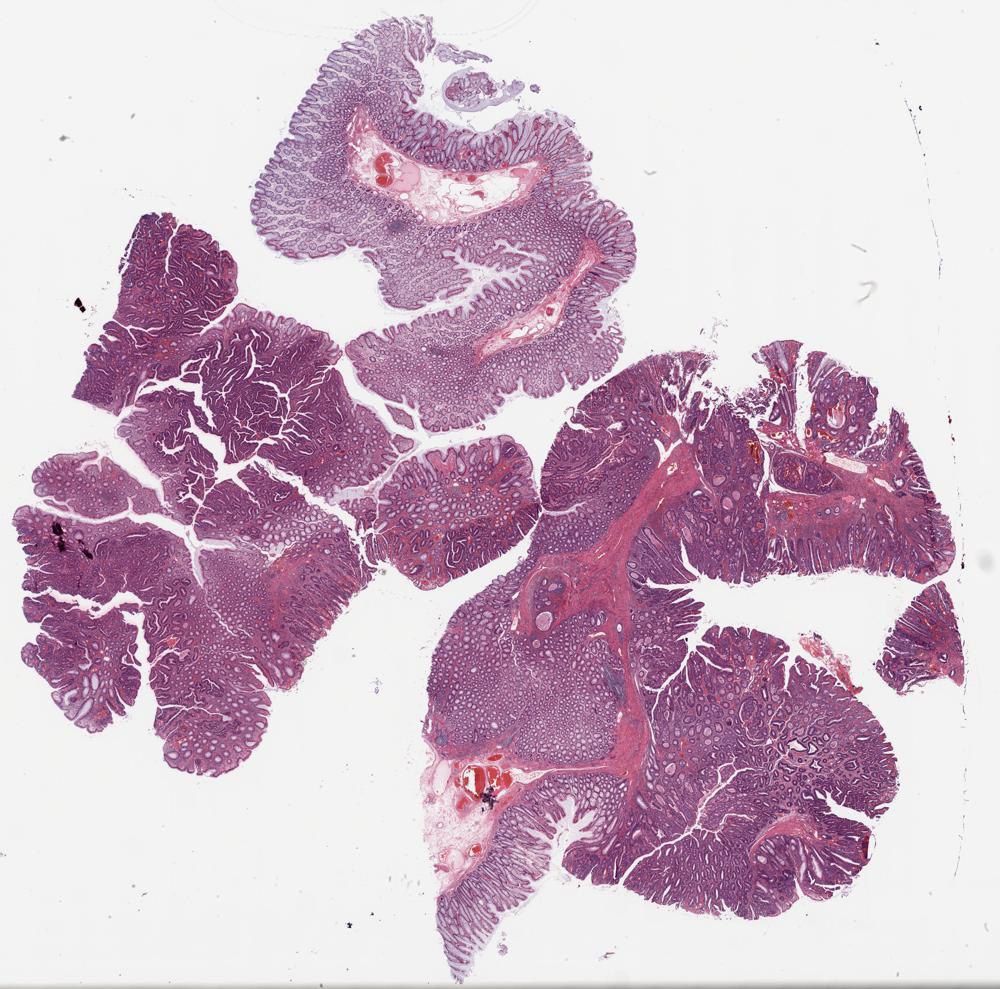

In [7]:
he_imgs[1]

In [8]:
len(he_imgs)

35

In [9]:
def thumbnail(img, size = (1000,1000)):
    """Converts Pillow images to a different size without modifying the original image
    """
    img_thumbnail = img.copy()
    img_thumbnail.thumbnail(size)
    return img_thumbnail

In [10]:
def img_grid(imgs, thumbnail_size = (200,200), size = (7,5)):
    thumbnail_width, thumbnail_height = thumbnail_size
    img_width, img_height = size[1]*thumbnail_width, size[0]*thumbnail_height
    blank_img = Image.new('RGB', (img_width, img_height), (255, 255, 255))
    i = 0
    for y in range(size[1]):
        for x in range(size[0]):
            img = imgs[i].convert('RGB')
            img_small = thumbnail(img, size = thumbnail_size)
            blank_img.paste(img_small, (y*thumbnail_width, x*thumbnail_height))
            i += 1
    return blank_img

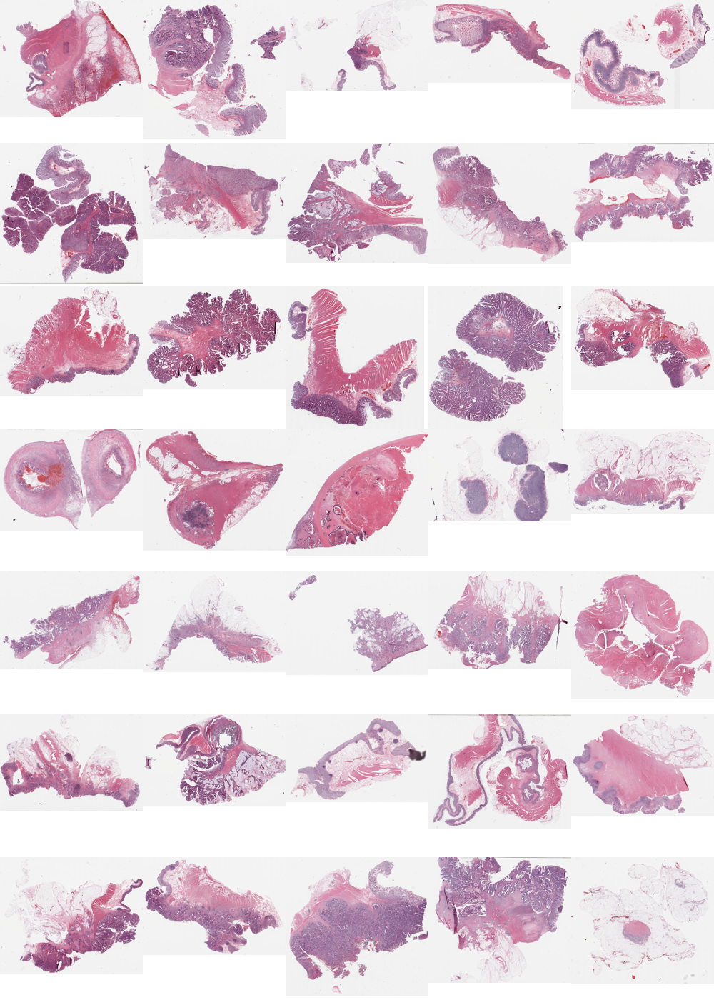

In [11]:
img_grid(he_imgs)

In [12]:
ImageStat.Stat(he_imgs[0]).mean

[219.216306097561, 186.53434634146342, 200.30796219512195]

In [13]:
img_means = []
img_medians = []
for img in he_imgs:
    img_means.append(ImageStat.Stat(img).mean)
    img_medians.append(ImageStat.Stat(img).median)
img_means = np.array(img_means)
img_medians = np.array(img_medians)

In [14]:
r_means = img_means[:,0]
g_means = img_means[:,1]
b_means = img_means[:,2]
r_medians = img_medians[:,0]
g_medians = img_medians[:,1]
b_medians = img_medians[:,2]

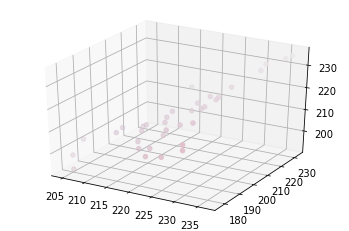

In [15]:
fig = plt.figure()
ax = plt.axes(projection = '3d')
ax.scatter3D(r_means, g_means, b_means, c = img_means/255.0)

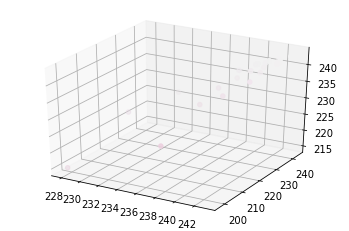

In [16]:
fig = plt.figure()
ax = plt.axes(projection = '3d')
ax.scatter3D(r_medians, g_medians, b_medians, c = img_medians/255.0)

## Stain Normalisation

In [17]:
template_slide = open_slide(str(TEMPLATE_SLIDE_PATH))

In [18]:
template_img = read_slide_at_mag(template_slide, 0.5)

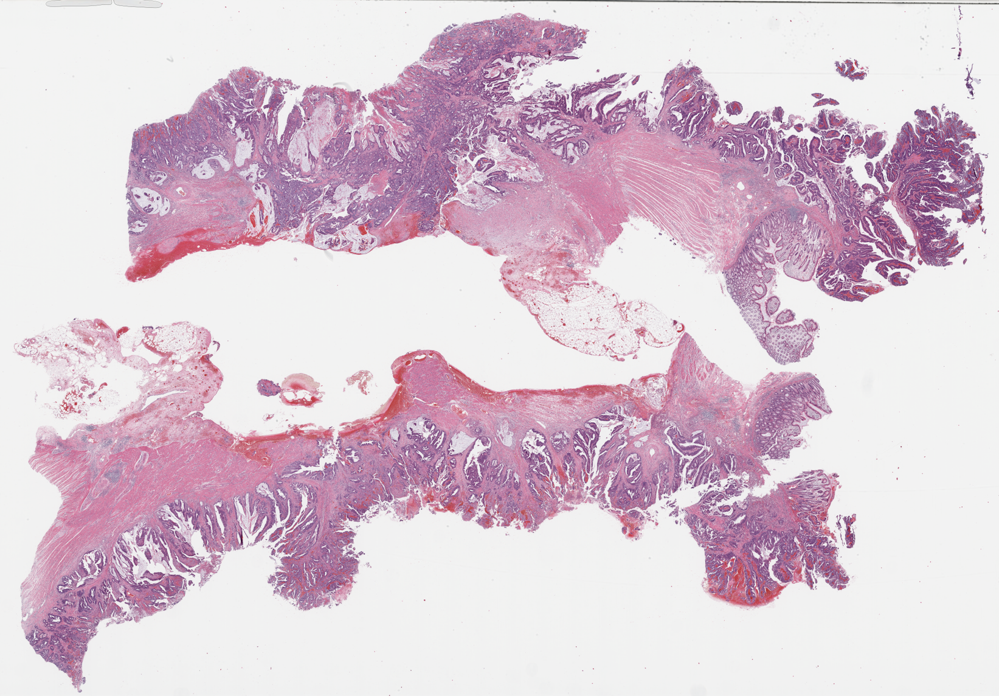

In [19]:
template_img

In [34]:
# normaliser = staintools.StainNormalizer(method='vahadane')
normaliser = staintools.ReinhardColorNormalizer()

In [31]:
template_std = LuminosityStandardizer.standardize(np.array(template_img))

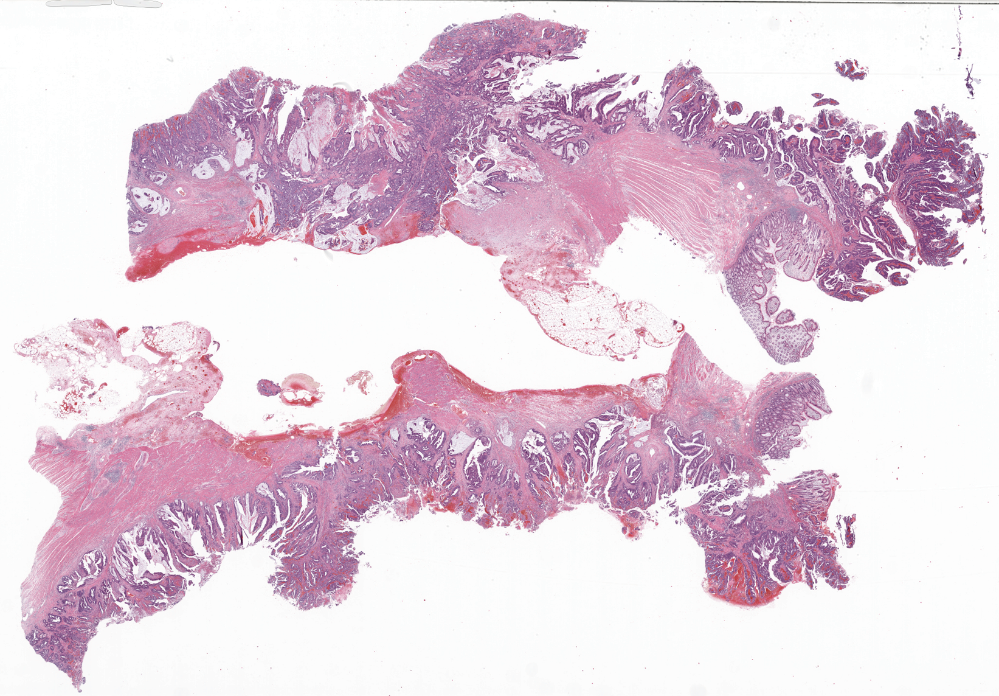

In [32]:
Image.fromarray(template_std)

In [50]:
# normaliser.fit(template_std)
normaliser.fit(np.array(template_img))

In [51]:
slide_norm_imgs = []
for slide_name in HE_slides:
    print(slide_name)
    slide = open_slide(str(SLIDES_PATH.joinpath(slide_name)))
    slide_img = read_slide_at_mag(slide, 1.0)
    #slide_std = LuminosityStandardizer.standardize(np.array(slide_img))
    #slide_transformed = normaliser.transform(slide_std)
    slide_transformed = normaliser.transform(np.array(slide_img))
    slide_norm_imgs.append(Image.fromarray(slide_transformed))

1792_T_9500_3_HandE.svs
1794_T_9504_3_HandE.svs
1798_T_9514_3_HandE.svs
1820_N_10545A_2_HandE.svs
1820_T_105452F_2_HandE.svs
1843_T_9561_3_HandE.svs
1879_T_9580_3_HandE.svs
1910_T_9637_3_HandE.svs
1915_T_10464_3_HandE.svs
1919_T_10779_3_HandE.svs
1928_T_9644_3_HandE.svs
1932_T_9876_3_HandE.svs
1939_T_9661_3_HandE.svs
1957_T_9668_3_HandE.svs
2011_T_9699_3_HandE.svs
2019_T_9717_3_HandE.svs
2023_T_9727_3_HandE.svs
2036_T_9729_3_HandE.svs
2038_T_11986_3_HandE.svs
2065_N_12752A_2_HandE.svs
2065_T_12756A_2_HandE.svs
2075_T_9787_3_HandE.svs
2090_T_10594_3_HandE.svs
2107_T_9806_3_HandE.svs
2112_N_12341B_2_HandE.svs
2112_T_12335F_2_HandE.svs
2148_N_11397A_2_HandE.svs
2148_T_11393A_2_HandE.svs
2171_N_11521A_2_HandE.svs
2171_T_11524A_2_HandE.svs
232_T_13230_3_HandE.svs
2382_T_15360_3_HandE.svs
526_T_15907_3_HandE.svs
526_T_15915_3_HandE.svs
526_T_15923_3_HandE.svs


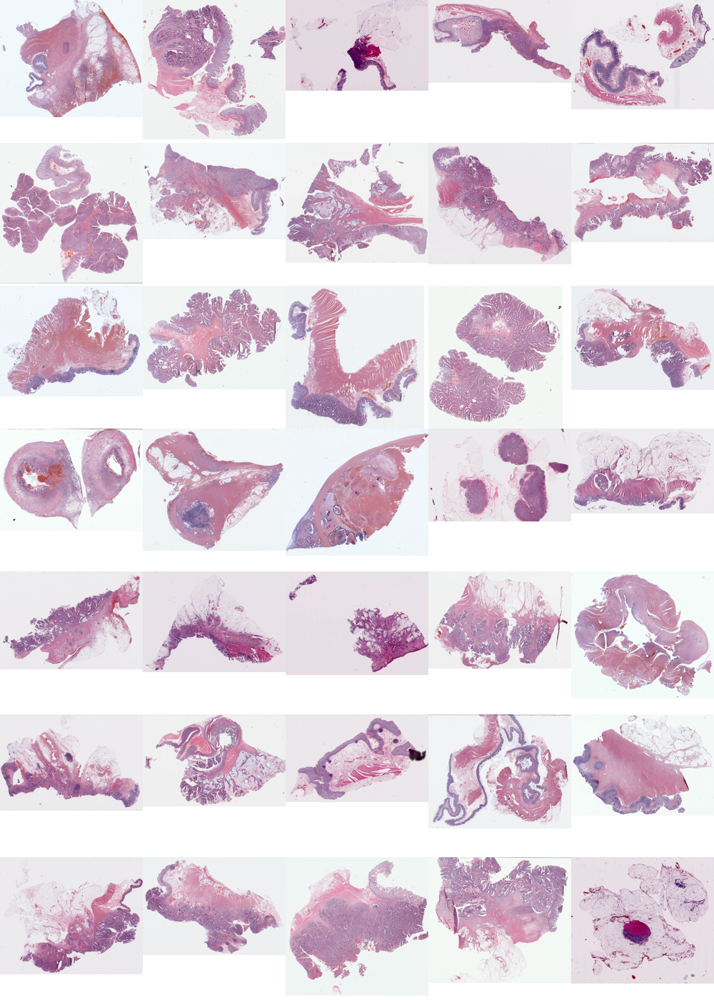

In [52]:
img_grid(slide_norm_imgs)

In [63]:
HE_names = [slide[:-4] for slide in HE_slides]
HE_names

['1792_T_9500_3_HandE',
 '1794_T_9504_3_HandE',
 '1798_T_9514_3_HandE',
 '1820_N_10545A_2_HandE',
 '1820_T_105452F_2_HandE',
 '1843_T_9561_3_HandE',
 '1879_T_9580_3_HandE',
 '1910_T_9637_3_HandE',
 '1915_T_10464_3_HandE',
 '1919_T_10779_3_HandE',
 '1928_T_9644_3_HandE',
 '1932_T_9876_3_HandE',
 '1939_T_9661_3_HandE',
 '1957_T_9668_3_HandE',
 '2011_T_9699_3_HandE',
 '2019_T_9717_3_HandE',
 '2023_T_9727_3_HandE',
 '2036_T_9729_3_HandE',
 '2038_T_11986_3_HandE',
 '2065_N_12752A_2_HandE',
 '2065_T_12756A_2_HandE',
 '2075_T_9787_3_HandE',
 '2090_T_10594_3_HandE',
 '2107_T_9806_3_HandE',
 '2112_N_12341B_2_HandE',
 '2112_T_12335F_2_HandE',
 '2148_N_11397A_2_HandE',
 '2148_T_11393A_2_HandE',
 '2171_N_11521A_2_HandE',
 '2171_T_11524A_2_HandE',
 '232_T_13230_3_HandE',
 '2382_T_15360_3_HandE',
 '526_T_15907_3_HandE',
 '526_T_15915_3_HandE',
 '526_T_15923_3_HandE']

In [70]:
def save_imgs(img_list, img_names, output_path):
    for img, name in zip(img_list, img_names):
        path = output_path.joinpath(name + '.jpeg')
        img.save(path)
        print('Saved {0}'.format(path))    

In [71]:
Reinhard_Output_Path = Path('/gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard')
save_imgs(slide_norm_imgs, HE_names, Reinhard_Output_Path)

Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1792_T_9500_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1794_T_9504_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1798_T_9514_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1820_N_10545A_2_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1820_T_105452F_2_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1843_T_9561_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1879_T_9580_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1910_T_9637_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1915_T_10464_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1919_T_10779_3_HandE.jpeg
Saved /gpfs1/scratch/90days/s4436005/Slides/normalised/Reinhard/1928_T_9644_3_HandE.jpeg
Saved /gpfs1/s

Script

In [26]:
# User Input parameters
SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005/')
OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/train_imgs_norm')
TEMPLATE_SLIDE_PATH = SLIDES_PATH.joinpath('2171_T_11524A_2_HandE.svs')

ALIGNMENT_MAG = 2
TILE_MAG = 10
VERBOSE = True

#Verbose functions
if VERBOSE:
    verbose_print = lambda *args: print(*args)
    verbose_save_img = lambda img, path, img_type: img.save(path, img_type)
    verbose_save_fig = lambda fig, path, dpi=300: fig.savefig(path, dpi=dpi)
else:
    verbose_print = lambda *args: None
    verbose_save_img = lambda *args: None
    verbose_save_fig = lambda *args: None

# Find Slides
slides = []
for slide in SLIDES_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()

In [27]:
HE_slides = [slide for slide in slides if 'HandE' in slide]
HE_slides

['1820_N_10545A_2_HandE.svs',
 '1820_T_105452F_2_HandE.svs',
 '2065_N_12752A_2_HandE.svs',
 '2065_T_12756A_2_HandE.svs',
 '2112_N_12341B_2_HandE.svs',
 '2112_T_12335F_2_HandE.svs',
 '2148_N_11397A_2_HandE.svs',
 '2148_T_11393A_2_HandE.svs',
 '2171_N_11521A_2_HandE.svs',
 '2171_T_11524A_2_HandE.svs']

In [28]:
ALIGN_MAG_OUTPUT_PATH = OUTPUT_PATH.joinpath(str(ALIGNMENT_MAG) + 'x')
TILE_MAG_OUTPUT_PATH = OUTPUT_PATH.joinpath(str(TILE_MAG) + 'x')
os.makedirs(ALIGN_MAG_OUTPUT_PATH, exist_ok = True)
os.makedirs(TILE_MAG_OUTPUT_PATH, exist_ok = True)

In [8]:
#Load and fit template slide
template_slide = open_slide(str(TEMPLATE_SLIDE_PATH))
template = read_slide_at_mag(template_slide, ALIGNMENT_MAG)
normaliser = staintools.StainNormalizer(method='vahadane')
template_std = LuminosityStandardizer.standardize(np.array(template))
normaliser.fit(template_std)

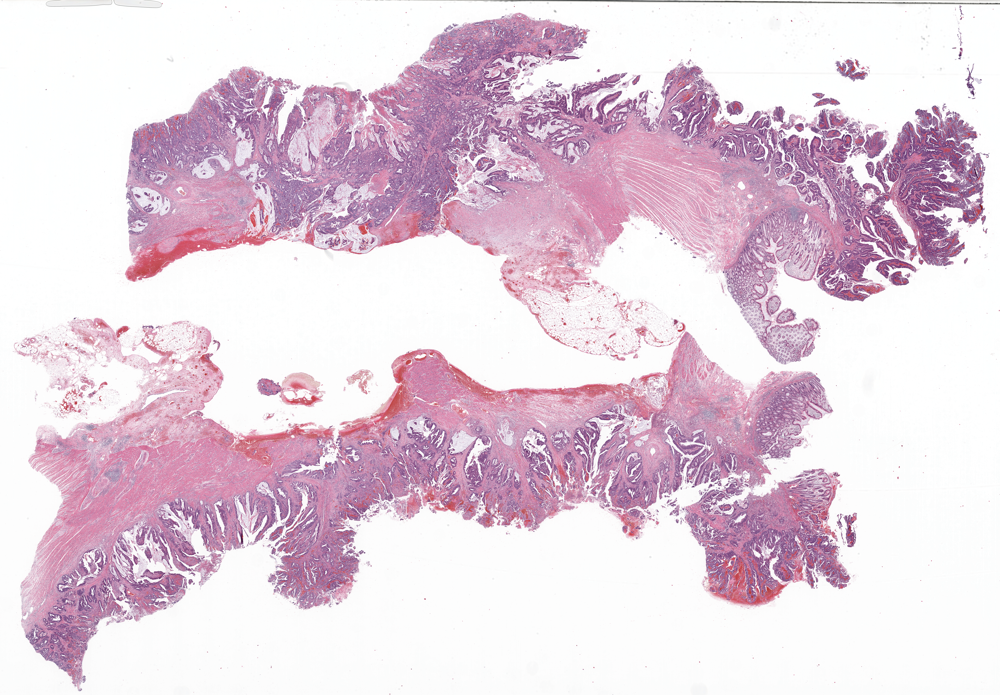

In [21]:
thumbnail(Image.fromarray(template_std))

In [13]:
#for SLIDE_NUM in range(len(HE_slides)):
for SLIDE_NUM in [4]:
    PREFIX = HE_slides[SLIDE_NUM][:-4]
    verbose_print('Processing Slide: {0}'.format(PREFIX))
    he_name = HE_slides[SLIDE_NUM]
    he_slide = open_slide(str(SLIDES_PATH.joinpath(he_name)))
    #Alignment Mag
#     he_align_mag = read_slide_at_mag(he_slide, ALIGNMENT_MAG)
#     verbose_print('Read in Slide at Alignment Mag')
#     he_align_std = LuminosityStandardizer.standardize(np.array(he_align_mag))
#     he_align_transformed = normaliser.transform(he_align_std)
#     he_align_norm = Image.fromarray(he_align_transformed)
#     he_align_norm.save(ALIGN_MAG_OUTPUT_PATH.joinpath(PREFIX + '.jpeg'), 'JPEG')
#     verbose_print('Exported Slide at Alignment Mag')
    #Tile Mag
    he_tile_mag = read_slide_at_mag(he_slide, TILE_MAG)
    verbose_print('Read in Slide at Tile Mag')
    he_tile_std = LuminosityStandardizer.standardize(np.array(he_tile_mag))
    he_tile_transformed = normaliser.transform(he_tile_std)
    he_tile_norm = Image.fromarray(he_tile_transformed)
    he_tile_norm.save(TILE_MAG_OUTPUT_PATH.joinpath(PREFIX + '.jpeg'), 'JPEG')
    verbose_print('Exported Slide at Tile Mag')

Processing Slide: 1820_T_105452F_2_HandE
Read in Slide at Tile Mag
Exported Slide at Tile Mag


In [14]:
TILE_MAG_OUTPUT_PATH

PosixPath('/gpfs1/scratch/90days/s4436005/img_reg/train_dataset_10x_09_12_19/10x')

# Adaptation of Stain Tool Stain Normaliser Class to work for tiles

In [1]:
#Not all these packages are required but they are here for completeness
import importlib
import io
import matplotlib.pyplot as plt
import numpy as np
import os
import openslide
from openslide import open_slide
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops, ImageDraw
import SimpleITK as sitk
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_holes
import staintools
from staintools.stain_extraction.macenko_stain_extractor import MacenkoStainExtractor
from staintools.stain_extraction.vahadane_stain_extractor import VahadaneStainExtractor
from staintools.miscellaneous.optical_density_conversion import convert_OD_to_RGB
from staintools.miscellaneous.get_concentrations import get_concentrations
import cv2 as cv
from staintools.preprocessing.input_validation import is_uint8_image
import sys


Image.MAX_IMAGE_PIXELS = None